<a href="https://colab.research.google.com/github/Bhavin15-byte/Dog-Vision-AI-Dog-Breed-Classifier/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow hub.

## 1. Problem

Identifying the breed of a dog an image of a dog.

When i am sitting at a cafe and i take a photo of a dog, I want to know what breed of dog is it.

## 2. Data

The data we are using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features

Some features about the data:
* We're dealing with image (unstructured data) so it's probably best use deep learning/Transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we will want to predict them).


In [3]:
# import Tensorflow into colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


# Get our workspace ready

 * import tensorflow 2.x
 * import tensorflow hub
 * Make sure we're using a GPU

In [4]:
# Run this cell
try:
  # %tensorflow_version only exists in Colab
  %tensorflow_version 2.x
except Exception:
  pass


Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [5]:
# import necessary Tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ",hub.__version__)

# Check the GPU availability
print("GPU", "available (YES!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.15.0
TF Hub version:  0.16.1
GPU not available


## Getting our data ready (turning into tensors)

With all machine learning models, our data has to be in numerical format. so that's what we will be doing first. Turning our images into Tensors (numerical represntations).

Let's start by accessing our data and checking out the labels.

In [6]:
# Checkout the labels of our data

import pandas as pd
import numpy as np
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

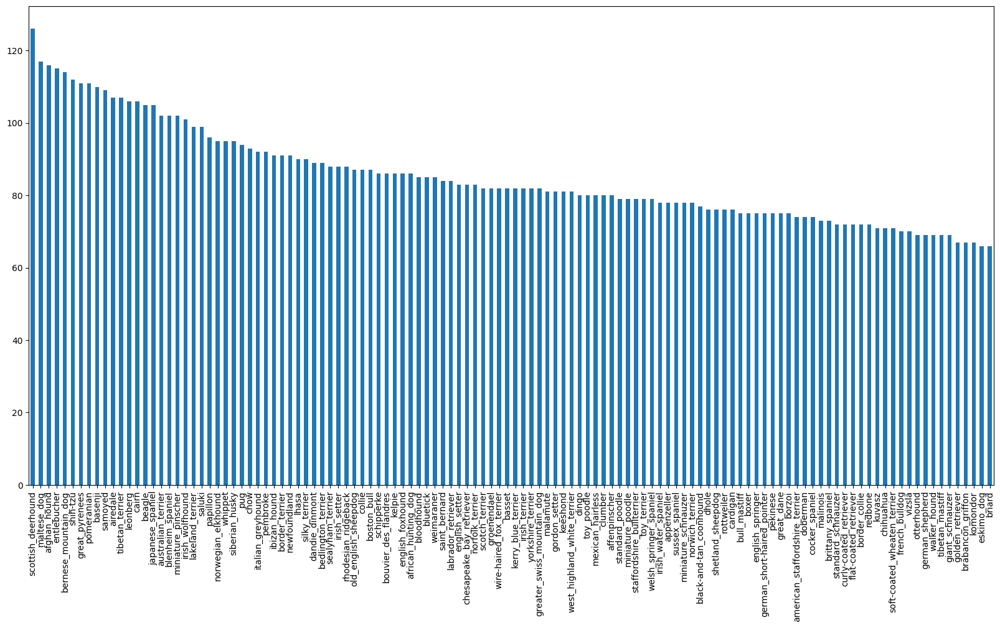

In [8]:
# How many images are there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [9]:
# What's the median number of images per class ?

labels_csv["breed"].value_counts().median()

82.0

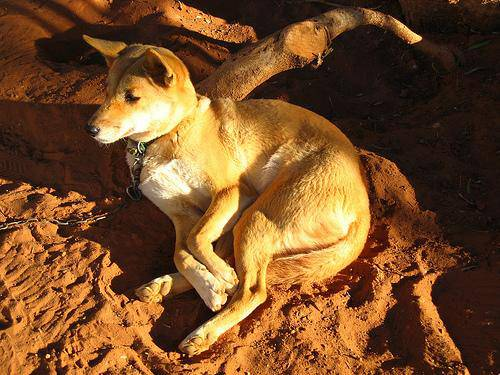

In [10]:
# Let's view an image

from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get the list of all our image file path names.

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
# Create path name from image ID's
filename = ["drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filename[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# Checking whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog vision/train/")) == len(filename):
  print("Filename match actual amount of files!!! Proceed.")
else:
  print("Filename do not match actual amount of files, Check the target directory.")

Filename match actual amount of files!!! Proceed.


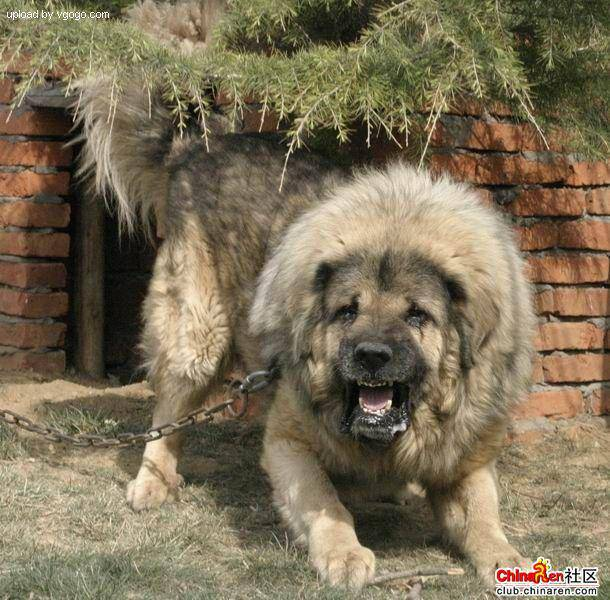

In [14]:
# one more check
Image(filename[9000])

In [15]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have got our training image filepaths in a list, let's prepare our labels.

In [16]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
# See if number of labels matches the number of filename
if len(labels) == len(filename):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [19]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [20]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turn every label into an boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example: turning boolean array into integers
print(labels[0])  #original label
print(np.where(unique_breeds == labels[0])) # indx where label occur
print(boolean_labels[0].argmax())  # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
filename[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle does not come with a validation set, we are going to create our own

In [26]:
# setup X and y variables
X = filename
y = boolean_labels

In [27]:
len(filename)

10222

We are going to start off experimenting with ~1000 images and increase as needed.

In [28]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step: 100}

In [29]:
# Let's split our data into tain and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [30]:
# Lets have a geez at training data
X_train[:5], y_train[:5]

(['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (turning imagess into Tensors)
To preprocess our images into Tensor we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

### Before we do. let's see what importing an image looks like

In [31]:
# Convert an image to a numpy array
from matplotlib import image as mpimage
image = mpimage.imread(filename[42])
image.shape

(257, 350, 3)

In [32]:
image.max(), image.min()

(255, 0)

In [33]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [34]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we have seen what an image looks like as Tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

> Indented block



In [35]:
# Define image size
IMG_SIZE = 224

# Create a function for precessing inmages
def process_image(image_path):
  """
  Takes an image file path and turns the image into Tensor.
  """

  # Read in an  image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 coour channels (Read, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches ?

Let's say you are trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:


In [36]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [37]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have gota way to turn our data into tuples of Tensors
in the form: `(image, label)`, let's make a function to turn all of our data(X & y) into batches!

In [38]:
import tensorflow as tf

# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data from image (X) and label (y) pairs.
    Shuffles the data if it's training data but does not shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """

    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print("Creating test data batches....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # only filepaths (no labels)
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch

    # If the data is a validation dataset, we don't need to shuffle it
    elif valid_data:
        print("Creating Validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))  # filepaths and labels
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

    else:
        print("Creating Training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(X))

        # Create (image, label) tuples (this also turns the image path into a processed image)
        data = data.map(get_image_label)

        # Turn the training data into batches
        data_batch = data.batch(batch_size)
        return data_batch


In [39]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating Training data batches...
Creating Validation data batches...


In [40]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.

In [41]:
import matplotlib.pyplot as plt

# Create a aafunction for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (foer displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows , 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [42]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [43]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

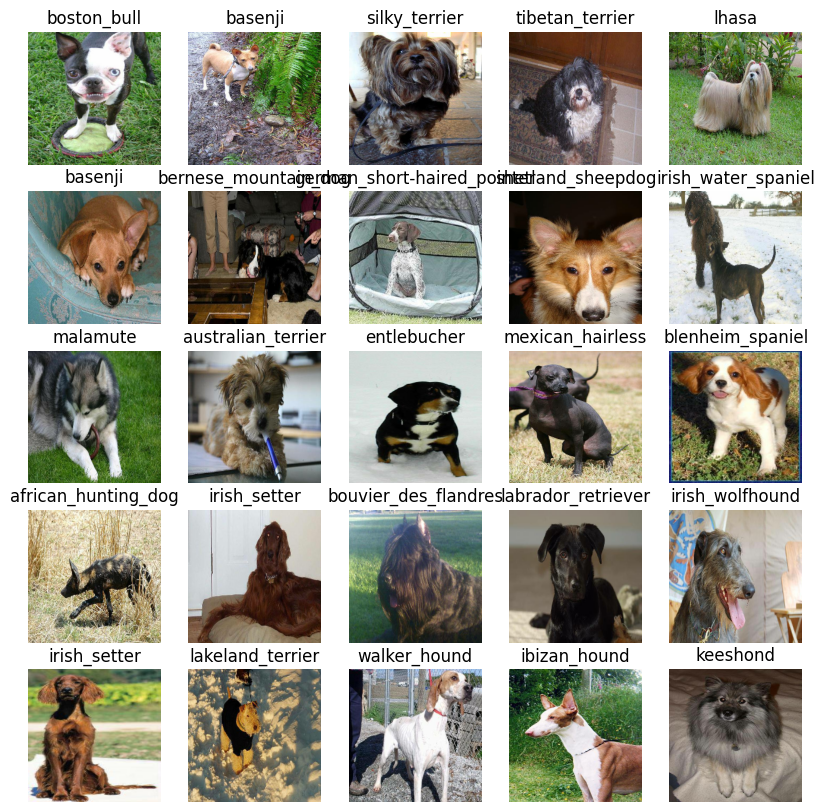

In [44]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

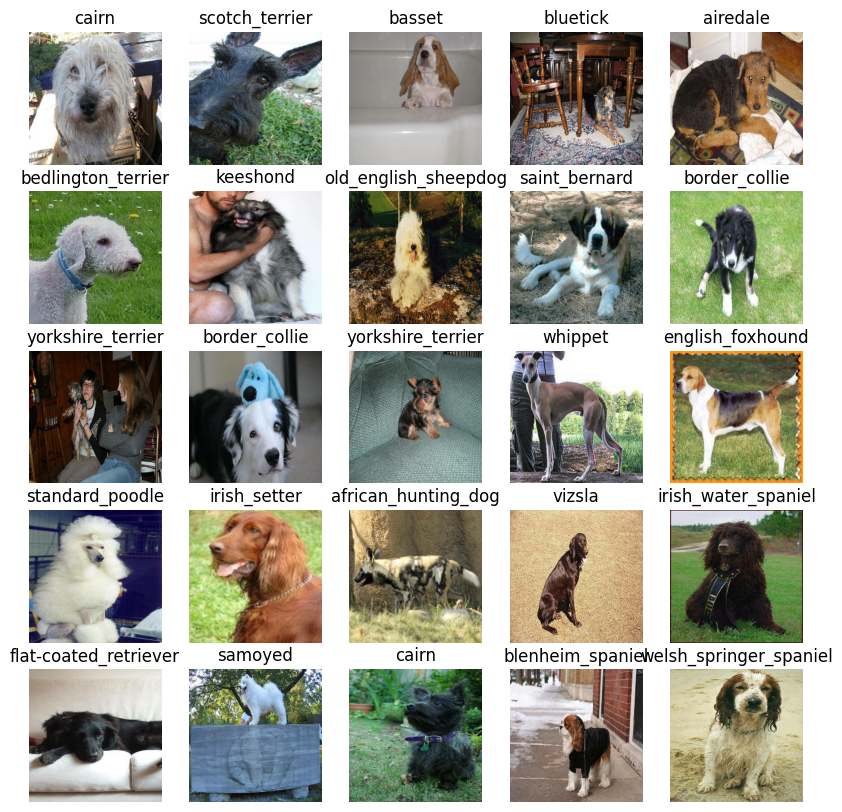

In [45]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Before we build a model, there are a few things to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output Shape (images labels, in the form of Tensors) of out model.
* The URL of the model we want to use.

In [46]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we have got our inputs, outputs and model ready to go.

Let's put them together into a Keras deep Learning Model!!

Knowing this, let's create a afunction which:

* Takes the input shape, output shape and the model we have chosen as parameters.

* Defines the layers in  a Keras model in sequential fashion (do this first, then this, then that).

* Compiles the model (says it should be evaluated and improved).

* Builds the model (tells the model the input shape it will be getting).

* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [47]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [48]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard Which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard Callback, we need to do 3 things:

1. Load the TensorBoard notebook extension

2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.

3. Visualize our models training logs with the `%tensorboard` magic function (we will do this after model training).

In [49]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [50]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog vision/logs",
                        # Make it so the logs get tracked whenever we run experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [51]:
# Create early stop callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train pn 1000 images, to make sure everything is working.

In [52]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100}

In [53]:
# Check to make sure we are still running on a GPU
print("GPU", "Available (YES!!!!)" if tf.config.list_physical_devices("GPU") else "not available :( ")

GPU not available :( 


Let's create a function which trains a model.

* Create a model using `create_model()`.

* Setup a TensorBoard callback using `create_tensorboard_callback()`

* Call the `fit()` function on our model passing it the training data, number of epochs to train for (`NUM_Epochs`) and the callbacks we would like to use.

* Return the model

In [54]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [55]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 214s 9s/step - loss: 4.7030 - accuracy: 0.0925 - val_loss: 3.5120 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 35s 1s/step - loss: 1.6971 - accuracy: 0.6888 - val_loss: 2.1810 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 32s 1s/step - loss: 0.5869 - accuracy: 0.9388 - val_loss: 1.6835 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 32s 1s/step - loss: 0.2573 - accuracy: 0.9862 - val_loss: 1.4867 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 36s 1s/step - loss: 0.1499 - accuracy: 0.9962 - val_loss: 1.4155 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 42s 2s/step - loss: 0.1024 - accuracy: 0.9987 - val_loss: 1.3685 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 35s 1s

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validaation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning !!!!

### Checking the tensorboard logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [56]:
%tensorboard --logdir drive/My\Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [57]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 47s 856ms/step


array([[7.73307867e-04, 8.58020649e-05, 2.25067628e-03, ...,
        1.50736526e-03, 8.98776052e-05, 2.08951882e-03],
       [3.55814188e-03, 2.51740520e-03, 7.03504728e-03, ...,
        6.65776548e-04, 1.82027160e-03, 2.13180581e-04],
       [6.44778702e-05, 5.32781451e-05, 1.50907450e-04, ...,
        8.99874576e-05, 6.31272414e-05, 2.85160640e-04],
       ...,
       [6.71642010e-06, 1.68462109e-04, 1.81706018e-05, ...,
        1.34150896e-05, 1.76997801e-05, 1.10222834e-04],
       [4.62767715e-03, 1.17099215e-03, 1.17282057e-03, ...,
        8.28949793e-04, 2.23730007e-04, 6.27756910e-03],
       [5.76236518e-04, 1.72795553e-04, 1.46312435e-04, ...,
        4.65146545e-03, 1.96931884e-03, 1.29053427e-04]], dtype=float32)

In [58]:
np.sum(predictions[0])

1.0

In [59]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction ): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.97750720e-04 4.75038018e-04 3.44669788e-05 1.05788786e-04
 5.19500161e-03 1.02162373e-03 1.41448894e-04 9.42873477e-04
 2.74789631e-02 1.29600123e-01 6.08606715e-05 2.17035937e-04
 1.09916483e-03 2.09634984e-03 3.85179161e-03 1.09452819e-02
 3.03438756e-05 2.42674164e-03 1.09354279e-03 3.35262099e-04
 3.38048412e-05 1.17847614e-03 3.89174471e-04 1.64023979e-04
 2.60343868e-02 9.87584470e-04 1.30671207e-04 6.21988846e-04
 2.47694581e-04 5.73998695e-05 1.16423500e-04 5.43392998e-05
 5.98962033e-05 1.16238676e-04 3.88948101e-05 3.26228008e-04
 2.91095418e-03 4.12134134e-04 6.04877714e-04 1.73200577e-01
 4.29407140e-04 9.73788847e-05 8.87006801e-03 1.60113792e-04
 3.33079719e-04 3.41178209e-04 4.45219252e-04 7.82668032e-03
 5.19674795e-04 1.15172472e-03 3.66245018e-04 3.28650902e-04
 3.37008387e-04 3.89231276e-03 1.94917175e-05 1.97163387e-03
 6.69047120e-04 3.21136758e-04 1.33278605e-04 9.21988394e-05
 4.78184011e-05 9.46298940e-04 9.57214361e-05 9.29733869e-05
 2.14596294e-04 4.545805

In [60]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the imagethe predcitioon is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [61]:
# Turn predition probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on a array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, We will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [62]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [63]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """

  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
     images.append(image)
     labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:

* Prediction labels

* Validation labels (truth labels)

* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.

* Convert the prediction probabilities to a predicted label.

* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [64]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{}{:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                    color=color)


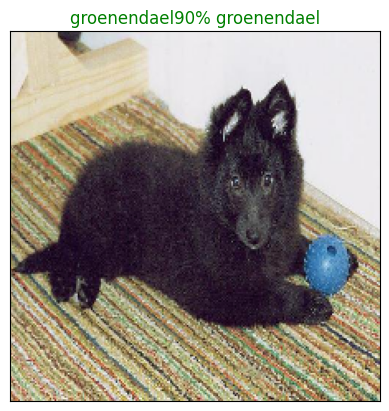

In [65]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our model's top predictions, let's make another to view our models top 10 predictions.

This function will:

 * Take an input of prediction probabilities array and a ground truth array and an integer.

 * Find the prediction using `get_pred_label()`

 * Find the top 10,
        * Prediction probabilities indexes
        * Prediction probabilities values
        * prediction labels

* plot the top 10 prediction probability values and labels, coloring the true label green.

In [66]:
def plot_pred_conf(prediction_probabilities, labels, unique_breeds, n=1):
    """
    Plot the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = unique_breeds[np.argmax(pred_prob)]

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    plt.figure(figsize=(10, 6))
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    # Change color of true label
    if true_label in top_10_pred_labels:
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
       pass

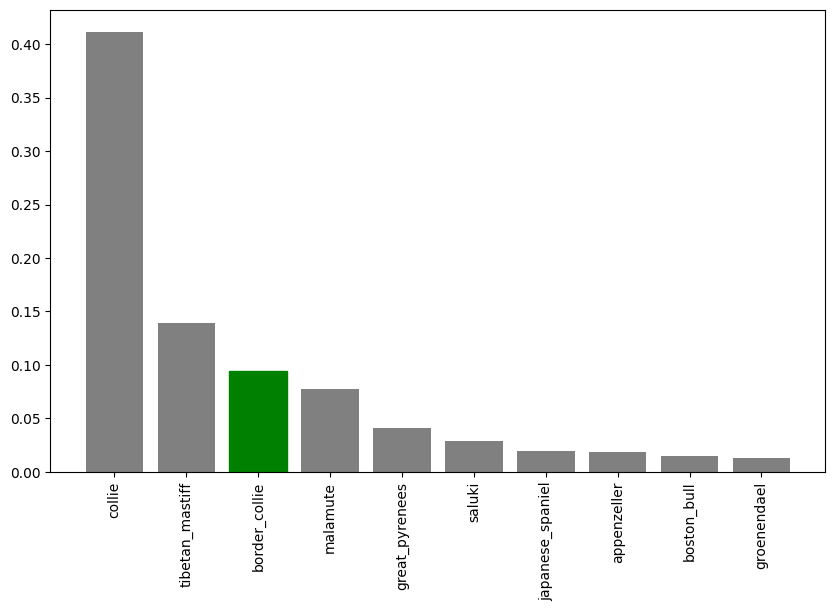

In [67]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, unique_breeds=unique_breeds, n=9)


Now we have got some functions to help us visualize our predictions and evalute our model, let's check out a few.

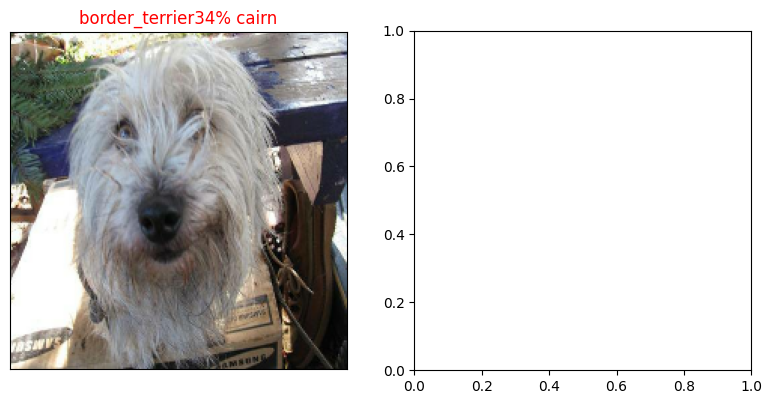

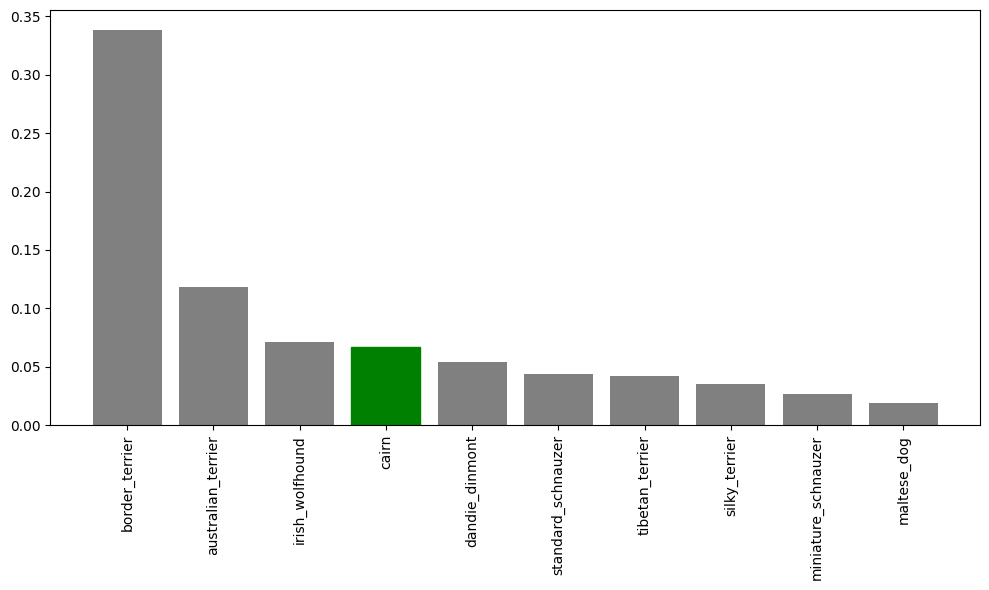

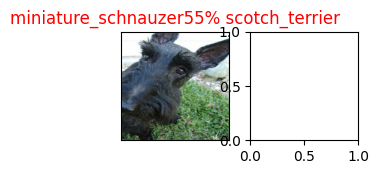

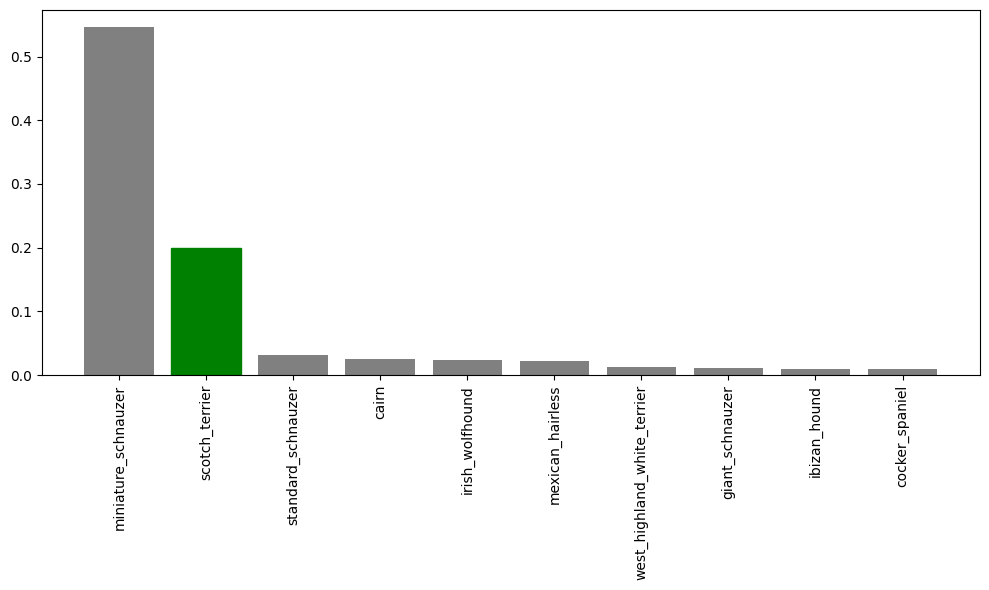

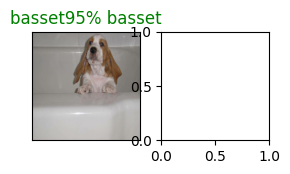

...

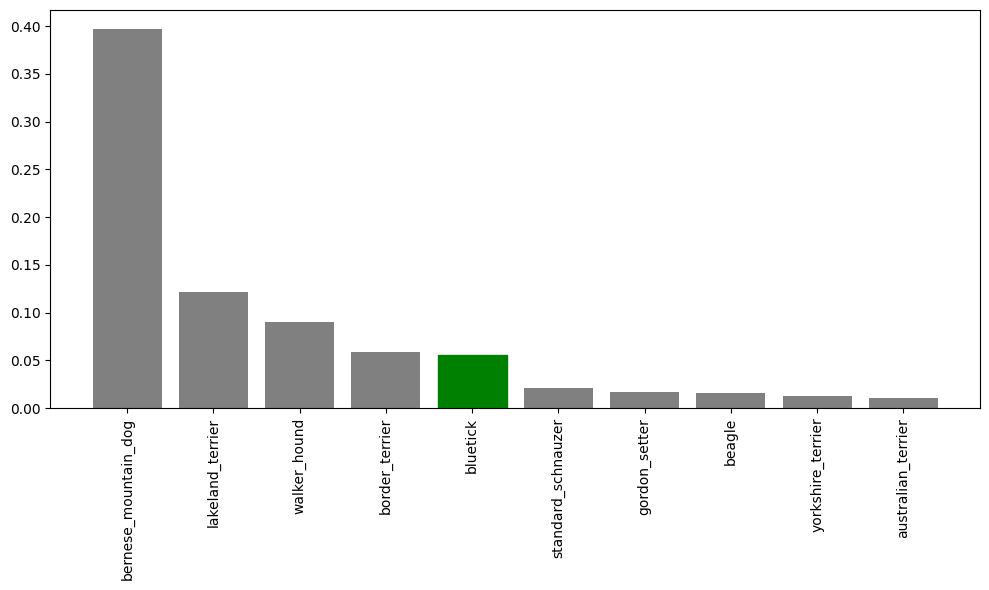

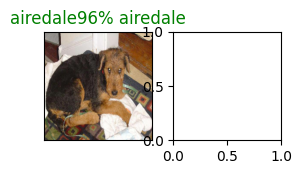

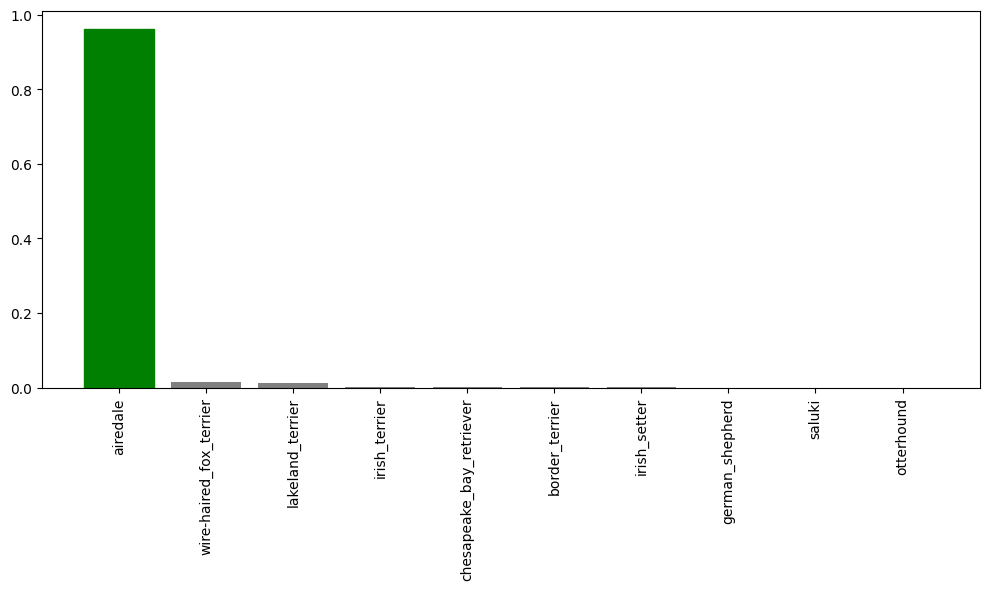

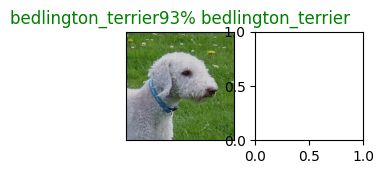

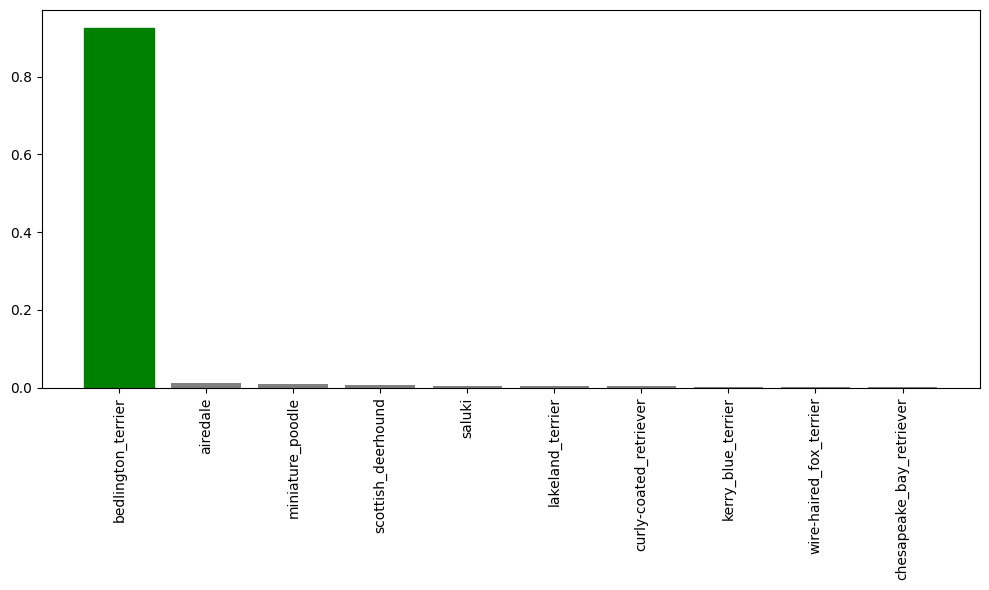

In [68]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)

    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   unique_breeds=unique_breeds,  # Assuming you have unique_breeds defined somewhere
                   n=i+i_multiplier)
    plt.tight_layout(h_pad=1.0)  # Adjusts subplots to prevent overlap
    plt.show()


**Challenge:** How would oucreate a confusion matrix with our models predictions and true labels ?


# Saving and reloading a trained Model

In [69]:
# Create a function to save a mode
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    """

    # Create a model directory pathname with current time
    modeldir = os.path.join("drive/MyDrive/Dog vision/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    model_path = modeldir + "-" + suffix + ".h5"   # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path


#Previous load model function
def load_model(model_path):

  """

  Loads a saved model from a specified path.

  """

  print(f"Loading saved model from: {model_path}")

  model = tf.keras.models.load_model(model_path,

                                     custom_objects={"KerasLayers":hub.
                                     KerasLayer})

  return model

In [70]:
# Create a function to load a trained model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")

    # Define custom objects dictionary
    custom_objects = {"KerasLayer": hub.KerasLayer}

    # Load the model with custom objects
    model = tf.keras.models.load_model(model_path, custom_objects=custom_objects)

    return model


Now we have got functions to save and load a trained model, let's make sure they work!

In [71]:
# Save our model trained on 1000 imagesa
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog vision/models/20240315-161631-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog vision/models/20240315-161631-1000-images-mobilenetv2-Adam.h5'

In [72]:
loaded_1000_image_model = load_model('drive/MyDrive/Dog vision/models/20240315-071459-1000-images-mobilenetv2-Adam.h5')


Loading saved model from: drive/MyDrive/Dog vision/models/20240315-071459-1000-images-mobilenetv2-Adam.h5


In [73]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 6s 849ms/step - loss: 1.2758 - accuracy: 0.6700


[1.2758450508117676, 0.6700000166893005]

In [74]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 7s 822ms/step - loss: 1.2740 - accuracy: 0.6800


[1.274040699005127, 0.6800000071525574]

## Training a big dog model (the full data)

In [75]:
len(X), len(y)

(10222, 10222)

In [76]:
# Create a data batch with the data set
full_data = create_data_batches(X, y)

Creating Training data batches...


In [77]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [78]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [79]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data , sowe can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we are using in the runtime has to load all of the images into memory.

In [80]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 348s 1s/step - loss: 1.3485 - accuracy: 0.6704
Epoch 2/100
320/320 [==============================] - 346s 1s/step - loss: 0.3943 - accuracy: 0.8841
Epoch 3/100
320/320 [==============================] - 354s 1s/step - loss: 0.2327 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 333s 1s/step - loss: 0.1536 - accuracy: 0.9616
Epoch 5/100
320/320 [==============================] - 345s 1s/step - loss: 0.1067 - accuracy: 0.9771
Epoch 6/100
320/320 [==============================] - 341s 1s/step - loss: 0.0763 - accuracy: 0.9879
Epoch 7/100
320/320 [==============================] - 346s 1s/step - loss: 0.0592 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 337s 1s/step - loss: 0.0464 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 335s 1s/step - loss: 0.0369 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 336s 1s/step - loss: 0.031

In [81]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog vision/models/20240315-180759-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog vision/models/20240315-180759-full-image-set-mobilenetv2-Adam.h5'

In [82]:
loaded_full_model = load_model('drive/MyDrive/Dog vision/models/20240315-073916-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog vision/models/20240315-073916-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and covert thrm into Tensor batches.

To make predictions on th test data, we will:

* Get the test image filenames.

* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (Since the test data does not have labels).

* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [83]:
# Load test image filenames
test_path = "drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/e4c743b9aaf615dd5fe162bf25f82fb5.jpg',
 'drive/MyDrive/Dog vision/test/de30e8d3cfd89cb021800007879f271b.jpg',
 'drive/MyDrive/Dog vision/test/e47de0441a48f2eff7c2faacd350ed06.jpg',
 'drive/MyDrive/Dog vision/test/e23ad195d88975333bbcde7dce5faf01.jpg',
 'drive/MyDrive/Dog vision/test/e2caef2df1087702936298aaac7843a1.jpg',
 'drive/MyDrive/Dog vision/test/e6999e18a8e98f7fc33cf520d26ec521.jpg',
 'drive/MyDrive/Dog vision/test/e386eaa78980be7183ecfdd32ecd2aab.jpg',
 'drive/MyDrive/Dog vision/test/e64b15ca154304104fe95ded7338858e.jpg',
 'drive/MyDrive/Dog vision/test/e61cd2626c01dd00117eca55fb099f5d.jpg',
 'drive/MyDrive/Dog vision/test/de6cc38e54a460dd34c53b74f022a8da.jpg']

In [84]:
len(test_filenames)

10377

In [85]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [86]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling `predict()` on our full model and passsing it the test data

1.   List item
2.   List item

batch will take a long time to run (about an ~1hr)

In [87]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

325/325 [==============================] - 533s 2s/step


In [88]:
# save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog vision/preds_array.csv", test_predictions, delimiter=",")

In [89]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog vision/preds_array.csv", delimiter=",")

In [90]:
test_predictions[:10]

array([[2.16479243e-08, 4.12702672e-09, 6.57635368e-09, ...,
        1.48386903e-07, 9.24618840e-01, 2.50019948e-04],
       [4.34472973e-08, 5.77878023e-11, 7.06620151e-10, ...,
        2.94709483e-12, 7.32992817e-07, 1.55169772e-07],
       [2.30073874e-05, 2.53530106e-05, 8.09120735e-08, ...,
        6.94652272e-07, 8.41459951e-08, 1.48677870e-08],
       ...,
       [1.35677558e-08, 3.08774240e-14, 1.87284410e-09, ...,
        1.64143017e-07, 2.84733748e-09, 1.82337558e-07],
       [9.78717907e-08, 4.48614871e-03, 2.77384471e-09, ...,
        6.09739218e-03, 4.42856447e-07, 5.55332444e-05],
       [1.03135599e-11, 2.01583283e-08, 1.37119320e-08, ...,
        7.97286432e-08, 2.51576466e-08, 2.96039332e-10]])

In [91]:
test_predictions.shape

(10377, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different breed.

https://www.kaggle.com/c/dog-breed-identification/overview

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID Column as well as a column for each dog breed.

* Add data to the ID column by extracting the test image ID'd from their filepaths.

* Add data (the prediction probabilities) to each of the dog breed columns.

* Export the dataFrame as a CSV to submit it to Kaggle.

In [92]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [93]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [94]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4c743b9aaf615dd5fe162bf25f82fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,de30e8d3cfd89cb021800007879f271b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e47de0441a48f2eff7c2faacd350ed06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e23ad195d88975333bbcde7dce5faf01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2caef2df1087702936298aaac7843a1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4c743b9aaf615dd5fe162bf25f82fb5,2.164792e-08,4.127027e-09,6.576354e-09,8.637047e-05,1.233131e-07,5.103809e-11,5.479638e-05,1.475341e-06,3.215615e-09,...,3.614347e-06,7.389215e-05,3.763234e-07,1.704589e-06,8.779856e-11,4.679358e-07,2.008584e-05,1.483869e-07,9.246188e-01,2.500199e-04
1,de30e8d3cfd89cb021800007879f271b,4.344730e-08,5.778780e-11,7.066202e-10,2.503593e-11,7.772789e-11,6.939929e-09,1.795884e-11,4.889163e-11,2.868386e-11,...,2.705064e-10,1.041070e-05,3.021263e-11,6.454481e-12,2.759407e-13,1.585885e-10,3.685970e-10,2.947095e-12,7.329928e-07,1.551698e-07
2,e47de0441a48f2eff7c2faacd350ed06,2.300739e-05,2.535301e-05,8.091207e-08,2.591649e-09,2.008765e-10,6.648969e-05,2.594104e-06,3.405277e-04,3.076950e-09,...,8.632867e-11,1.575632e-11,1.280463e-10,2.530353e-04,7.625262e-09,1.383993e-04,3.466154e-03,6.946523e-07,8.414600e-08,1.486779e-08
3,e23ad195d88975333bbcde7dce5faf01,2.650661e-09,1.368185e-09,1.460933e-13,5.140204e-11,1.073675e-07,4.134003e-12,6.859311e-09,1.545335e-10,6.581815e-10,...,2.805465e-10,3.943494e-10,2.332025e-11,7.895249e-08,1.737223e-08,2.212315e-10,5.219045e-09,7.079860e-12,6.298186e-11,8.052299e-13
4,e2caef2df1087702936298aaac7843a1,3.092363e-13,3.117598e-09,3.374508e-14,3.057455e-13,8.025303e-11,6.114409e-14,1.047149e-13,6.653917e-12,9.919574e-14,...,8.100013e-14,1.124295e-12,1.794693e-13,1.071264e-09,4.407502e-12,1.975858e-12,6.509705e-12,1.845189e-13,5.171570e-12,1.123155e-12


In [96]:
# Save our predictions dataframe to CSV for Submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we will:

* Get to know the filepaths of our own images.

* Turn the filepaths into data batches using `create_Data_batches()` parameter to `true`.

* Convert the prediction output probabilities to predictions labels.

* Compare the predicted labels to the custom images

In [142]:
import os

# Define the path to the directory containing the custom images
custom_path = "drive/MyDrive/Dog vision/my-dog-photos/"

# Get the list of file names in the directory
custom_filenames = os.listdir(custom_path)

# Create a list of file paths by joining the directory path with each file name
custom_image_paths = [os.path.join(custom_path, fname) for fname in custom_filenames]

# Print the list of custom image paths to verify
print(custom_image_paths)


['drive/MyDrive/Dog vision/my-dog-photos/5b949178a132d67b12a6a25b685a3ebf.jpg', 'drive/MyDrive/Dog vision/my-dog-photos/Dog.jpg']


In [143]:
# Check the first few file paths in custom_image_paths
custom_image_paths[:5]


['drive/MyDrive/Dog vision/my-dog-photos/5b949178a132d67b12a6a25b685a3ebf.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/Dog.jpg']

In [144]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)


Creating test data batches....


In [145]:
# Print custom image paths
print(custom_image_paths)

# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)


['drive/MyDrive/Dog vision/my-dog-photos/5b949178a132d67b12a6a25b685a3ebf.jpg', 'drive/MyDrive/Dog vision/my-dog-photos/Dog.jpg']
1/1 [==============================] - 0s 77ms/step


In [146]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)


1/1 [==============================] - 0s 149ms/step


In [147]:
custom_preds.shape

(2, 120)

In [148]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever']

In [149]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

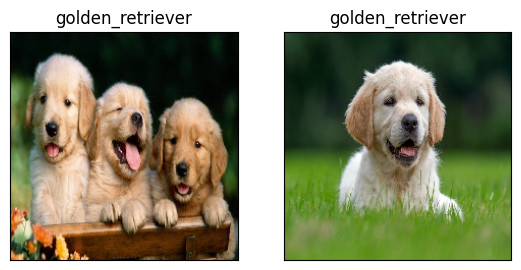

In [150]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)